# Industrial-scale penicillin production analysis

## 1. Import necessary packages

In [1]:
import math

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

import piecewise_regression

## 2. Import data sets and investigate data structure

In [2]:
# Load the time series process data
variable_data = pd.read_csv('100_Batches_IndPenSim_V3_variable_data.csv') 
# Load the penicillin yield statistics data
data_summary = pd.read_csv('Mendeley_data/100_Batches_IndPenSim_Statistics.csv')

In [3]:
# Set display option to show all columns
pd.set_option('display.max_columns', None)

In [4]:
data_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 5 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Batch ref                              100 non-null    int64  
 1   Penicllin_harvested_during_batch(kg)   100 non-null    float64
 2   Penicllin_harvested_end_of_batch (kg)  100 non-null    float64
 3   Penicllin_yield_total (kg)             100 non-null    float64
 4   Fault ref(0-NoFault 1-Fault)           100 non-null    int64  
dtypes: float64(3), int64(2)
memory usage: 4.0 KB


In [5]:
data_summary

,Batch ref,Penicllin_harvested_during_batch(kg),Penicllin_harvested_end_of_batch (kg),Penicllin_yield_total (kg),Fault ref(0-NoFault 1-Fault)
0,1,1066400.0,1720000.0,2786400.0,0
1,2,985910.0,1340100.0,2326000.0,0
2,3,1416100.0,1259200.0,2675300.0,0
3,4,815700.0,1071000.0,1886700.0,0
4,5,1128500.0,2434400.0,3562900.0,0
...,...,...,...,...,...
95,96,1141500.0,2453400.0,3595000.0,1
96,97,1439400.0,2454900.0,3894300.0,1
97,98,799760.0,930830.0,1730600.0,1
98,99,388650.0,502180.0,890830.0,1


In [6]:
variable_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113935 entries, 0 to 113934
Data columns (total 39 columns):
 #   Column                                                              Non-Null Count   Dtype  
---  ------                                                              --------------   -----  
 0   Time (h)                                                            113935 non-null  float64
 1   Aeration rate(Fg:L/h)                                               113935 non-null  float64
 2   Agitator RPM(RPM:RPM)                                               113935 non-null  float64
 3   Sugar feed rate(Fs:L/h)                                             113935 non-null  float64
 4   Acid flow rate(Fa:L/h)                                              113935 non-null  float64
 5   Base flow rate(Fb:L/h)                                              113935 non-null  float64
 6   Heating/cooling water flow rate(Fc:L/h)                             113935 non-null  float64
 7   He

## 3. Analyze the original data set

In [7]:
# Handling missing values

# 5 off-line measurement variables contain missing values due to their measurement frequency:
# 1. PAA concentration offline(PAA_offline:PAA (g L^{-1}))
# 2. NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1}))
# 3. Offline Penicillin concentration(P_offline:P(g L^{-1}))
# 4. Offline Biomass concentratio(X_offline:X(g L^{-1}))
# 5. Viscosity(Viscosity_offline:centPoise)

# These measurements include a pre-defined delay (4 time steps) as noted in the reference paper.

In [8]:
# Create a new column to indicate the batch length
# A value of 1 means fixed length (230 hours), and 0 means variable length
time_group = variable_data.groupby('Batch reference(Batch_ref:Batch ref)')['Time (h)'].max()
fixed_batch = time_group[time_group == 230].index

# Create a new column with default value 0
variable_data['0 - Variable 1 - Fixed(Batch_length:Batch length)'] = 0

# Set the value to 1 for batches with max time = 230 hours (fixed length)
for batch in fixed_batch:
    variable_data.loc[variable_data['Batch reference(Batch_ref:Batch ref)'] == batch, '0 - Variable 1 - Fixed(Batch_length:Batch length)'] = 1

In [9]:
variable_data

,Time (h),Aeration rate(Fg:L/h),Agitator RPM(RPM:RPM),Sugar feed rate(Fs:L/h),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Water for injection/dilution(Fw:L/h),Air head pressure(pressure:bar),Dumped broth flow(Fremoved:L/h),Substrate concentration(S:g/L),Dissolved oxygen concentration(DO2:mg/L),Penicillin concentration(P:g/L),Vessel Volume(V:L),Vessel Weight(Wt:Kg),pH(pH:pH),Temperature(T:K),Generated heat(Q:kJ),carbon dioxide percent in off-gas(CO2outgas:%),PAA flow(Fpaa:PAA flow (L/h)),PAA concentration offline(PAA_offline:PAA (g L^{-1})),Oil flow(Foil:L/hr),NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1})),Oxygen Uptake Rate(OUR:(g min^{-1})),Oxygen in percent in off-gas(O2:O2 (%)),Offline Penicillin concentration(P_offline:P(g L^{-1})),Offline Biomass concentratio(X_offline:X(g L^{-1})),Carbon evolution rate(CER:g/h),Ammonia shots(NH3_shots:kgs),Viscosity(Viscosity_offline:centPoise),Fault reference(Fault_ref:Fault ref),0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref),1- No Raman spec,1-Raman spec recorded,Batch reference(Batch_ref:Batch ref),2-PAT control(PAT_ref:PAT ref),Batch ID,Fault flag,0 - Variable 1 - Fixed(Batch_length:Batch length)
0,0.2,30.0,100.0,8.0,0.0000,30.1180,9.8335,0.00010,0.0,0.6,0.0,0.95749,14.711,1.017800e-25,58479.0,62574.0,6.4472,298.22,0.000001,0.089514,5.0,NaN,22.0,NaN,0.480510,0.19595,NaN,NaN,0.034045,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0
1,0.4,30.0,100.0,8.0,0.0000,51.2210,18.1550,0.00010,0.0,0.6,0.0,1.00460,14.699,1.000000e-03,58487.0,62585.0,6.4932,298.17,0.000001,0.101760,5.0,NaN,22.0,NaN,0.058147,0.20390,NaN,NaN,0.038702,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0
2,0.6,30.0,100.0,8.0,0.0000,54.3020,9.5982,0.00010,0.0,0.6,0.0,1.04980,14.686,9.993400e-04,58495.0,62598.0,6.5425,298.14,0.000001,0.105800,5.0,NaN,22.0,NaN,-0.041505,0.20575,NaN,NaN,0.040240,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0
3,0.8,30.0,100.0,8.0,0.0000,37.8160,4.3395,0.00010,0.0,0.6,0.0,1.09420,14.661,9.987400e-04,58499.0,62607.0,6.5753,298.11,0.000001,0.108190,5.0,NaN,22.0,NaN,-0.056737,0.20602,NaN,NaN,0.041149,0.0,NaN,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0
4,1.0,30.0,100.0,8.0,0.5181,18.9080,1.1045,0.00010,0.0,0.6,0.0,1.13700,14.633,9.982100e-04,58501.0,62613.0,6.5825,298.09,0.000001,0.110300,5.0,1488.0,22.0,1667.8,-0.049975,0.20589,1.017800e-25,0.52808,0.041951,0.0,4.083,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113930,229.2,65.0,100.0,80.0,0.0000,12.9000,33.5860,5.93590,250.0,0.9,0.0,72.70800,13.385,5.656700e+00,74071.0,84211.0,6.5085,297.89,215.090000,1.204400,4.0,NaN,23.0,NaN,0.323420,0.19996,NaN,NaN,0.995500,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,43854.0,44034.0,1
113931,229.4,65.0,100.0,80.0,0.0000,10.0470,10.0760,98.83400,250.0,0.9,0.0,72.77400,13.388,5.649000e+00,74133.0,84281.0,6.5080,298.07,278.390000,1.204100,4.0,NaN,23.0,NaN,0.316620,0.20002,NaN,NaN,0.995220,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44814.0,44659.0,1
113932,229.6,65.0,100.0,80.0,0.0000,7.3609,69.3450,9.88340,250.0,0.9,0.0,72.84200,13.390,5.641400e+00,74194.0,84350.0,6.5040,297.98,246.050000,1.203800,4.0,NaN,23.0,NaN,0.311680,0.20006,NaN,NaN,0.994940,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44273.0,43952.0,1
113933,229.8,65.0,100.0,80.0,0.0000,6.2794,38.6100,0.98834,250.0,0.9,0.0,72.91000,13.390,5.633900e+00,74255.0,84420.0,6.4987,297.88,212.630000,1.203400,4.0,NaN,23.0,NaN,0.311780,0.20006,NaN,NaN,0.994660,0.0,NaN,0.0,0.0,1.0,100.0,100.0,1.0,44733.0,45245.0,1


In [10]:
# Check if Agitator RPM is constant (fixed at 100 rpm)
variable_data['Agitator RPM(RPM:RPM)'].unique()

array([100.])

In [11]:
# Check if Ammonia shots are constant (fixed at 0 kg)
variable_data['Ammonia shots(NH3_shots:kgs)'].unique()

array([0.])

In [12]:
# Pre-selection of variables
# Drop:
# - Constant variables (Agitator RPM, Ammonia shots)
# - Reference variables not relevant to our analysis (Fault reference, Raman spec indicators, Batch ID)

variable_data = variable_data.drop(columns=['Agitator RPM(RPM:RPM)','Ammonia shots(NH3_shots:kgs)',
                                            'Fault reference(Fault_ref:Fault ref)','1- No Raman spec',' 1-Raman spec recorded','2-PAT control(PAT_ref:PAT ref)',
                                            'Batch ID','Fault flag'])

In [13]:
# Reorganize columns into logical groups for better analysis
response_var = ['Penicillin concentration(P:g/L)']
manual_control = ['Sugar feed rate(Fs:L/h)','Oil flow(Foil:L/hr)','Aeration rate(Fg:L/h)','Air head pressure(pressure:bar)','Dumped broth flow(Fremoved:L/h)','Water for injection/dilution(Fw:L/h)','PAA flow(Fpaa:PAA flow (L/h))']
automatic_control = ['Acid flow rate(Fa:L/h)','Base flow rate(Fb:L/h)','Heating/cooling water flow rate(Fc:L/h)','Heating water flow rate(Fh:L/h)']
online_measurements = ['Substrate concentration(S:g/L)','Dissolved oxygen concentration(DO2:mg/L)','Vessel Volume(V:L)','Vessel Weight(Wt:Kg)','Temperature(T:K)','pH(pH:pH)','carbon dioxide percent in off-gas(CO2outgas:%)','Oxygen in percent in off-gas(O2:O2  (%))','Oxygen Uptake Rate(OUR:(g min^{-1}))','Carbon evolution rate(CER:g/h)','Generated heat(Q:kJ)']
offline_measurements = ['Offline Penicillin concentration(P_offline:P(g L^{-1}))','PAA concentration offline(PAA_offline:PAA (g L^{-1}))','NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1}))','Offline Biomass concentratio(X_offline:X(g L^{-1}))','Viscosity(Viscosity_offline:centPoise)']

column_order = ['Time (h)'] + ['Batch reference(Batch_ref:Batch ref)'] + ['0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref)'] + ['0 - Variable 1 - Fixed(Batch_length:Batch length)'] + manual_control + automatic_control + online_measurements + response_var + offline_measurements

variable_data = variable_data[column_order]

In [14]:
variable_data

,Time (h),Batch reference(Batch_ref:Batch ref),0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref),0 - Variable 1 - Fixed(Batch_length:Batch length),Sugar feed rate(Fs:L/h),Oil flow(Foil:L/hr),Aeration rate(Fg:L/h),Air head pressure(pressure:bar),Dumped broth flow(Fremoved:L/h),Water for injection/dilution(Fw:L/h),PAA flow(Fpaa:PAA flow (L/h)),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Substrate concentration(S:g/L),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),Vessel Weight(Wt:Kg),Temperature(T:K),pH(pH:pH),carbon dioxide percent in off-gas(CO2outgas:%),Oxygen in percent in off-gas(O2:O2 (%)),Oxygen Uptake Rate(OUR:(g min^{-1})),Carbon evolution rate(CER:g/h),Generated heat(Q:kJ),Penicillin concentration(P:g/L),Offline Penicillin concentration(P_offline:P(g L^{-1})),PAA concentration offline(PAA_offline:PAA (g L^{-1})),NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1})),Offline Biomass concentratio(X_offline:X(g L^{-1})),Viscosity(Viscosity_offline:centPoise)
0,0.2,1.0,0.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,30.1180,9.8335,0.00010,0.95749,14.711,58479.0,62574.0,298.22,6.4472,0.089514,0.19595,0.480510,0.034045,0.000001,1.017800e-25,NaN,NaN,NaN,NaN,NaN
1,0.4,1.0,0.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,51.2210,18.1550,0.00010,1.00460,14.699,58487.0,62585.0,298.17,6.4932,0.101760,0.20390,0.058147,0.038702,0.000001,1.000000e-03,NaN,NaN,NaN,NaN,NaN
2,0.6,1.0,0.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,54.3020,9.5982,0.00010,1.04980,14.686,58495.0,62598.0,298.14,6.5425,0.105800,0.20575,-0.041505,0.040240,0.000001,9.993400e-04,NaN,NaN,NaN,NaN,NaN
3,0.8,1.0,0.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,37.8160,4.3395,0.00010,1.09420,14.661,58499.0,62607.0,298.11,6.5753,0.108190,0.20602,-0.056737,0.041149,0.000001,9.987400e-04,NaN,NaN,NaN,NaN,NaN
4,1.0,1.0,0.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.5181,18.9080,1.1045,0.00010,1.13700,14.633,58501.0,62613.0,298.09,6.5825,0.110300,0.20589,-0.049975,0.041951,0.000001,9.982100e-04,1.017800e-25,1488.0,1667.8,0.52808,4.083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113930,229.2,100.0,0.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,12.9000,33.5860,5.93590,72.70800,13.385,74071.0,84211.0,297.89,6.5085,1.204400,0.19996,0.323420,0.995500,215.090000,5.656700e+00,NaN,NaN,NaN,NaN,NaN
113931,229.4,100.0,0.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,10.0470,10.0760,98.83400,72.77400,13.388,74133.0,84281.0,298.07,6.5080,1.204100,0.20002,0.316620,0.995220,278.390000,5.649000e+00,NaN,NaN,NaN,NaN,NaN
113932,229.6,100.0,0.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,7.3609,69.3450,9.88340,72.84200,13.390,74194.0,84350.0,297.98,6.5040,1.203800,0.20006,0.311680,0.994940,246.050000,5.641400e+00,NaN,NaN,NaN,NaN,NaN
113933,229.8,100.0,0.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,6.2794,38.6100,0.98834,72.91000,13.390,74255.0,84420.0,297.88,6.4987,1.203400,0.20006,0.311780,0.994660,212.630000,5.633900e+00,NaN,NaN,NaN,NaN,NaN


## 4. Create a filtered dataset for recipe-driven batches

In [15]:
# The 100 batches are controlled using different control strategies
## Batches 1-30: Controlled by recipe driven approach.
## Batches 31-60: Controlled by operators.
## Batches 61-90: Controlled by an Advanced Process Control (APC) solution using the Raman spectroscopy.
## Batches 91-100: Contain faults resulting in process deviations.

# Filter data to include only recipe-driven batches (1-30)
variable_data_recipe = variable_data[variable_data['Batch reference(Batch_ref:Batch ref)'].between(1,30)]
# Drop the control reference column as it's constant for these batches
variable_data_recipe = variable_data_recipe.drop(columns=['0 - Recipe driven 1 - Operator controlled(Control_ref:Control ref)'])

In [16]:
variable_data_recipe

,Time (h),Batch reference(Batch_ref:Batch ref),0 - Variable 1 - Fixed(Batch_length:Batch length),Sugar feed rate(Fs:L/h),Oil flow(Foil:L/hr),Aeration rate(Fg:L/h),Air head pressure(pressure:bar),Dumped broth flow(Fremoved:L/h),Water for injection/dilution(Fw:L/h),PAA flow(Fpaa:PAA flow (L/h)),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Substrate concentration(S:g/L),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),Vessel Weight(Wt:Kg),Temperature(T:K),pH(pH:pH),carbon dioxide percent in off-gas(CO2outgas:%),Oxygen in percent in off-gas(O2:O2 (%)),Oxygen Uptake Rate(OUR:(g min^{-1})),Carbon evolution rate(CER:g/h),Generated heat(Q:kJ),Penicillin concentration(P:g/L),Offline Penicillin concentration(P_offline:P(g L^{-1})),PAA concentration offline(PAA_offline:PAA (g L^{-1})),NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1})),Offline Biomass concentratio(X_offline:X(g L^{-1})),Viscosity(Viscosity_offline:centPoise)
0,0.2,1.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,30.1180,9.8335,0.0001,0.95749,14.711,58479.0,62574.0,298.22,6.4472,0.089514,0.19595,0.480510,0.034045,0.000001,1.017800e-25,NaN,NaN,NaN,NaN,NaN
1,0.4,1.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,51.2210,18.1550,0.0001,1.00460,14.699,58487.0,62585.0,298.17,6.4932,0.101760,0.20390,0.058147,0.038702,0.000001,1.000000e-03,NaN,NaN,NaN,NaN,NaN
2,0.6,1.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,54.3020,9.5982,0.0001,1.04980,14.686,58495.0,62598.0,298.14,6.5425,0.105800,0.20575,-0.041505,0.040240,0.000001,9.993400e-04,NaN,NaN,NaN,NaN,NaN
3,0.8,1.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0000,37.8160,4.3395,0.0001,1.09420,14.661,58499.0,62607.0,298.11,6.5753,0.108190,0.20602,-0.056737,0.041149,0.000001,9.987400e-04,NaN,NaN,NaN,NaN,NaN
4,1.0,1.0,0,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.5181,18.9080,1.1045,0.0001,1.13700,14.633,58501.0,62613.0,298.09,6.5825,0.110300,0.20589,-0.049975,0.041951,0.000001,9.982100e-04,1.017800e-25,1488.0,1667.8,0.52808,4.083
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34320,229.2,30.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,7.4635,23.0480,191.9500,71.57100,14.510,72032.0,80529.0,298.28,6.5035,1.070200,0.19923,0.439620,0.884200,589.270000,9.737000e+00,NaN,NaN,NaN,NaN,NaN
34321,229.4,30.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,6.5791,161.6700,19.1950,71.68700,14.491,72093.0,80600.0,298.02,6.4993,1.069700,0.19905,0.461450,0.883800,502.200000,9.723700e+00,NaN,NaN,NaN,NaN,NaN
34322,229.6,30.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,7.4004,80.4950,1.9195,71.80500,14.498,72155.0,80671.0,297.84,6.4961,1.069200,0.19904,0.462580,0.883400,439.180000,9.710300e+00,NaN,NaN,NaN,NaN,NaN
34323,229.8,30.0,1,80.0,23.0,65.0,0.9,0.0,250.0,4.0,0.0000,9.4854,24.1490,104.5200,71.92400,14.505,72217.0,80743.0,298.01,6.4953,1.068700,0.19904,0.462800,0.883000,498.920000,9.697000e+00,NaN,NaN,NaN,NaN,NaN


In [17]:
# Get column names for reference
variable_list = variable_data_recipe.columns
variable_list

Index(['Time (h)', 'Batch reference(Batch_ref:Batch ref)',
       '0 - Variable 1 - Fixed(Batch_length:Batch length)',
       'Sugar feed rate(Fs:L/h)', 'Oil flow(Foil:L/hr)',
       'Aeration rate(Fg:L/h)', 'Air head pressure(pressure:bar)',
       'Dumped broth flow(Fremoved:L/h)',
       'Water for injection/dilution(Fw:L/h)', 'PAA flow(Fpaa:PAA flow (L/h))',
       'Acid flow rate(Fa:L/h)', 'Base flow rate(Fb:L/h)',
       'Heating/cooling water flow rate(Fc:L/h)',
       'Heating water flow rate(Fh:L/h)', 'Substrate concentration(S:g/L)',
       'Dissolved oxygen concentration(DO2:mg/L)', 'Vessel Volume(V:L)',
       'Vessel Weight(Wt:Kg)', 'Temperature(T:K)', 'pH(pH:pH)',
       'carbon dioxide percent in off-gas(CO2outgas:%)',
       'Oxygen in percent in off-gas(O2:O2  (%))',
       'Oxygen Uptake Rate(OUR:(g min^{-1}))',
       'Carbon evolution rate(CER:g/h)', 'Generated heat(Q:kJ)',
       'Penicillin concentration(P:g/L)',
       'Offline Penicillin concentration(P_offline:

## 5. Exploratory Data Analysis

### 5.1 Time series visualization of process variables

In [18]:
# Extract data at the first timestamp (0.2 hours) to examine initial conditions
variable_data_recipe_T0 = variable_data_recipe[variable_data_recipe['Time (h)'] == 0.2].copy()
variable_data_recipe_T0.describe()

,Time (h),Batch reference(Batch_ref:Batch ref),0 - Variable 1 - Fixed(Batch_length:Batch length),Sugar feed rate(Fs:L/h),Oil flow(Foil:L/hr),Aeration rate(Fg:L/h),Air head pressure(pressure:bar),Dumped broth flow(Fremoved:L/h),Water for injection/dilution(Fw:L/h),PAA flow(Fpaa:PAA flow (L/h)),Acid flow rate(Fa:L/h),Base flow rate(Fb:L/h),Heating/cooling water flow rate(Fc:L/h),Heating water flow rate(Fh:L/h),Substrate concentration(S:g/L),Dissolved oxygen concentration(DO2:mg/L),Vessel Volume(V:L),Vessel Weight(Wt:Kg),Temperature(T:K),pH(pH:pH),carbon dioxide percent in off-gas(CO2outgas:%),Oxygen in percent in off-gas(O2:O2 (%)),Oxygen Uptake Rate(OUR:(g min^{-1})),Carbon evolution rate(CER:g/h),Generated heat(Q:kJ),Penicillin concentration(P:g/L),Offline Penicillin concentration(P_offline:P(g L^{-1})),PAA concentration offline(PAA_offline:PAA (g L^{-1})),NH_3 concentration off-line(NH3_offline:NH3 (g L^{-1})),Offline Biomass concentratio(X_offline:X(g L^{-1})),Viscosity(Viscosity_offline:centPoise)
count,3.000000e+01,30.000000,30.000000,30.0,30.0,30.0,30.0,30.0,30.0,30.0,30.0,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,3.000000e+01,0.0,0.0,0.0,0.0,0.0
mean,2.000000e-01,15.500000,0.500000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,14.594597,0.327880,199.632303,1.057444,14.678433,57987.833333,61926.433333,297.707333,6.498000,0.087955,0.204440,0.023555,0.033452,186.627267,9.000000e-04,NaN,NaN,NaN,NaN,NaN
std,8.469019e-17,8.803408,0.508548,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.776778,1.795325,113.984175,0.102748,0.053343,545.996279,496.587436,0.171322,0.071464,0.005105,0.010389,0.556694,0.001942,111.844618,3.051286e-04,NaN,NaN,NaN,NaN,NaN
min,2.000000e-01,1.000000,0.000000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,0.000000,0.000100,0.000100,0.844020,14.486000,56840.000000,60970.000000,297.440000,6.395000,0.077186,0.184360,-1.029400,0.029355,0.000001,1.017800e-25,NaN,NaN,NaN,NaN,NaN
25%,2.000000e-01,8.250000,0.000000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,0.000000,0.000100,109.212500,0.980715,14.665250,57541.000000,61721.000000,297.620000,6.452325,0.084984,0.198068,-0.329458,0.032322,97.265250,1.000000e-03,NaN,NaN,NaN,NaN,NaN
50%,2.000000e-01,15.500000,0.500000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,8.904650,0.000100,202.880000,1.044200,14.681500,58119.500000,61965.000000,297.685000,6.472950,0.087864,0.204790,0.011372,0.033417,186.985000,1.000000e-03,NaN,NaN,NaN,NaN,NaN
75%,2.000000e-01,22.750000,1.000000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,25.471500,0.000100,261.335000,1.150850,14.714750,58426.750000,62226.250000,297.820000,6.540475,0.090293,0.211113,0.369250,0.034341,247.932500,1.000000e-03,NaN,NaN,NaN,NaN,NaN
max,2.000000e-01,30.000000,1.000000,8.0,22.0,30.0,0.6,0.0,0.0,5.0,0.0,60.230000,9.833500,408.170000,1.228600,14.752000,58730.000000,62698.000000,298.220000,6.710500,0.098621,0.223760,1.079800,0.037509,392.990000,1.000000e-03,NaN,NaN,NaN,NaN,NaN


In [19]:
# Configuration for plotting
n_cols = 4
n_plots_per_fig = 30

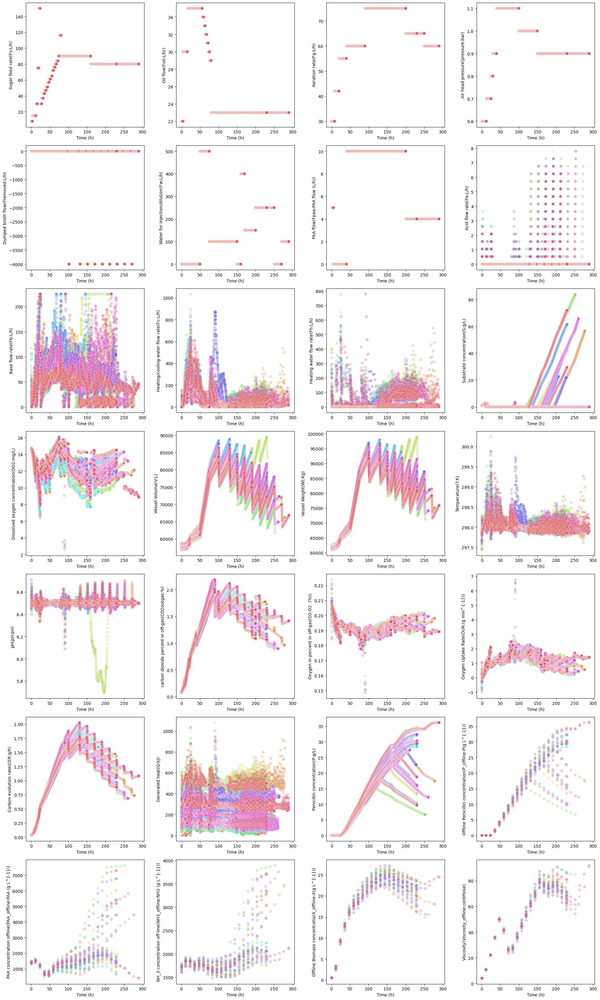

In [20]:
# Filter out categorical variables for time series plots
categorical_vars = ['Batch reference(Batch_ref:Batch ref)','0 - Variable 1 - Fixed(Batch_length:Batch length)']
variable_list_continuous = [var for var in variable_list if var not in categorical_vars]
variable_list_continuous_filtered_T = [var for var in variable_list_continuous if var != 'Time (h)']

# Create scatterplots for all continuous variables for recipe-driven batches
for i in range(math.ceil(len(variable_list_continuous_filtered_T)/n_plots_per_fig)):
    # Get variables for this figure
    vars_subset = variable_list_continuous_filtered_T[i*n_plots_per_fig:min((i+1)*n_plots_per_fig, len(variable_list_continuous_filtered_T))]
    n_rows = math.ceil(len(vars_subset)/n_cols)
    # Create figure
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    # Create each subplot
    for j, var in enumerate(vars_subset):
        sns.scatterplot(data=variable_data_recipe, x='Time (h)', y=var, hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=50, alpha=0.3, legend=False, ax=axes[j])
        # axes[j].set_title(var, fontsize=12)
        axes[j].set_xlabel('Time (h)')
        axes[j].set_ylabel(var)
        axes[j].tick_params(axis='both')
    # Hide unused subplots
    for k in range(len(vars_subset), len(axes)):
        axes[k].set_visible(False)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

In [21]:
# Check whether input variables show consistent patterns across batches.
for var in manual_control, automatic_control:
    print((variable_data_recipe.groupby('Time (h)')[var].nunique() == 1).all())

Sugar feed rate(Fs:L/h)                 True
Oil flow(Foil:L/hr)                     True
Aeration rate(Fg:L/h)                   True
Air head pressure(pressure:bar)         True
Dumped broth flow(Fremoved:L/h)         True
Water for injection/dilution(Fw:L/h)    True
PAA flow(Fpaa:PAA flow (L/h))           True
dtype: bool
Acid flow rate(Fa:L/h)                     False
Base flow rate(Fb:L/h)                     False
Heating/cooling water flow rate(Fc:L/h)    False
Heating water flow rate(Fh:L/h)            False
dtype: bool


### 5.2 Categorizing batches by acid flow rate

In [22]:
# Calculate summary statistics for acid flow rate by batch
batch_summary = variable_data_recipe.groupby('Batch reference(Batch_ref:Batch ref)')['Acid flow rate(Fa:L/h)'].describe().drop(columns='count')
batch_summary

,mean,std,min,25%,50%,75%,max
Batch reference(Batch_ref:Batch ref),,,,,,,
1.0,0.012411,0.127865,0.0,0.0,0.0,0.0,2.0823
2.0,0.006326,0.074865,0.0,0.0,0.0,0.0,1.5608
3.0,0.167319,0.865925,0.0,0.0,0.0,0.0,7.7988
4.0,0.139945,0.760564,0.0,0.0,0.0,0.0,6.7599
5.0,0.009864,0.108084,0.0,0.0,0.0,0.0,2.0819
6.0,0.149849,0.799557,0.0,0.0,0.0,0.0,7.7967
7.0,0.012525,0.128794,0.0,0.0,0.0,0.0,2.0793
8.0,0.007672,0.097761,0.0,0.0,0.0,0.0,2.0781
9.0,0.197791,0.863616,0.0,0.0,0.0,0.0,6.7602


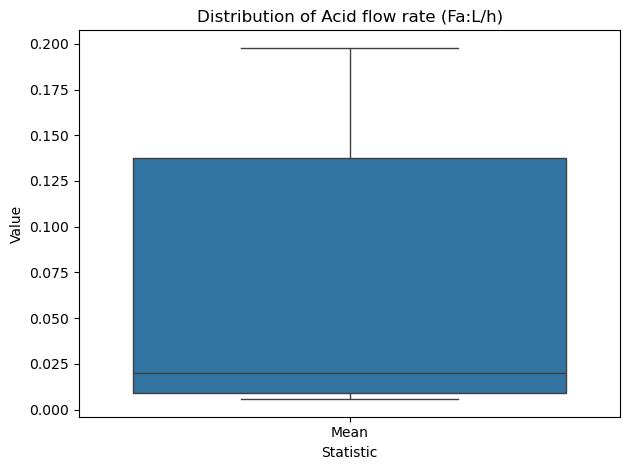

In [23]:
# Visualize the distribution of mean acid flow rate across batches
summary = pd.DataFrame({'Mean': batch_summary['mean'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Acid flow rate (Fa:L/h)')
plt.tight_layout()
plt.show()

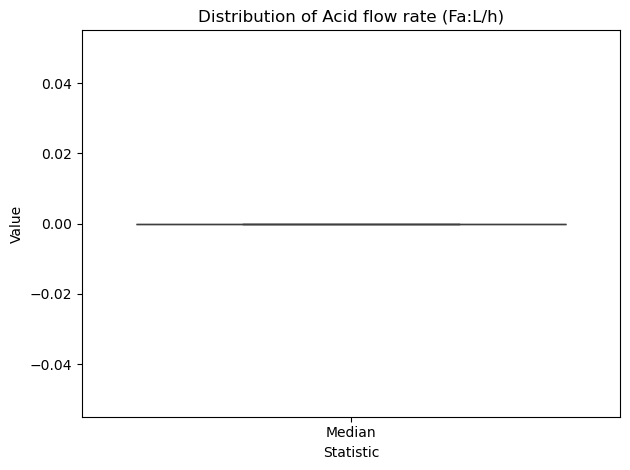

In [24]:
# Visualize the distribution of median acid flow rate across batches
summary = pd.DataFrame({'Median': batch_summary['50%'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Acid flow rate (Fa:L/h)')
plt.tight_layout()
plt.show()

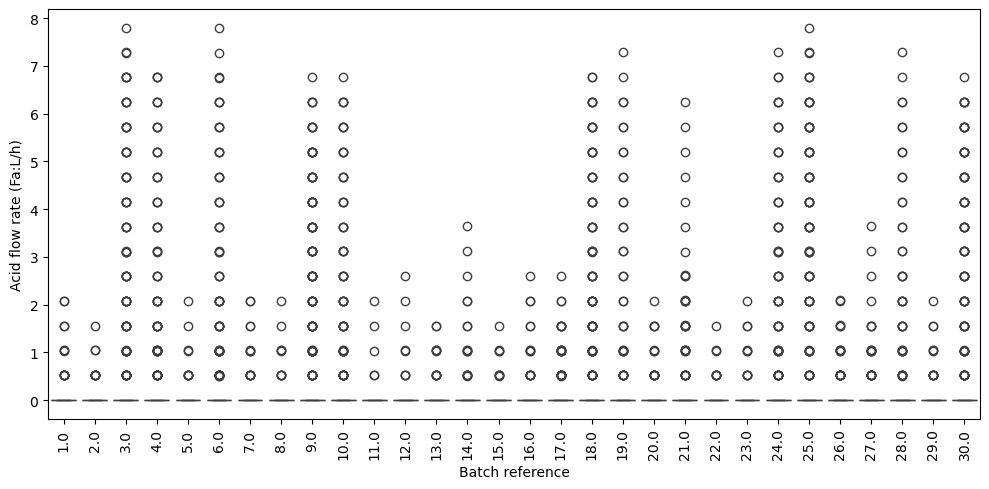

In [25]:
# Visualize the distribution of acid flow rate for each batch
plt.figure(figsize=(10, 5))
sns.boxplot(data=variable_data_recipe, x='Batch reference(Batch_ref:Batch ref)', y='Acid flow rate(Fa:L/h)')
# plt.title('Distribution of Acid flow rate by Batch reference', fontsize=12)
plt.xlabel('Batch reference')
plt.ylabel('Acid flow rate (Fa:L/h)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [26]:
# Based on the boxplot analysis, we'll categorize batches into:
# - Low acid flow batches
# - High acid flow batches
# - Medium acid flow batches (excluded from further analysis)

# Manually classify batches based on boxplot visualization
low_acid_flow = [1, 2, 5, 7, 8, 11, 13, 15, 20, 22, 23, 29]
high_acid_flow = [3, 4, 6, 9, 10, 18, 19, 21, 24, 25, 28, 30]

def acid_flow_group(batch_ref):
    if batch_ref in low_acid_flow:
        return 'Low acid flow'
    elif batch_ref in high_acid_flow:
        return 'High acid flow'
    else:
        return 'Medium acid flow'

# Create a new dataframe with acid flow group labels
df_acid_flow = variable_data_recipe.copy()
df_acid_flow['Acid flow group'] = df_acid_flow['Batch reference(Batch_ref:Batch ref)'].apply(acid_flow_group)
df_acid_flow = df_acid_flow[df_acid_flow['Acid flow group'] != 'Medium acid flow']

# Create separate dataframes for low and high acid flow batches
low_acid_data = df_acid_flow[df_acid_flow['Acid flow group'] == 'Low acid flow']
high_acid_data = df_acid_flow[df_acid_flow['Acid flow group'] == 'High acid flow']

### 5.3 Analysis of acid flow rate, pH, and penicillin concentration

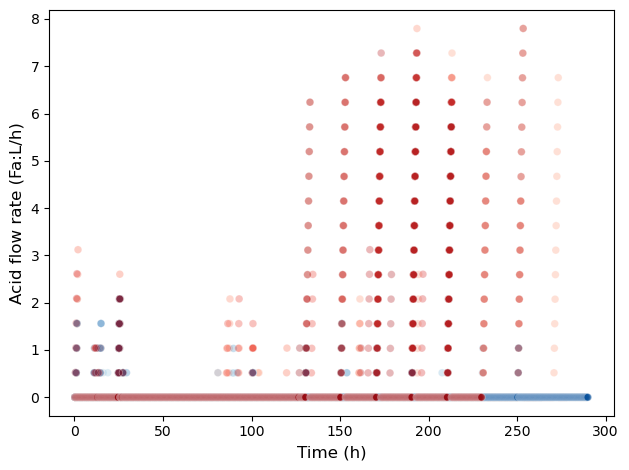

In [27]:
# Visualize acid flow rate by batch group (low vs high)
batch = df_acid_flow['Batch reference(Batch_ref:Batch ref)'].unique()

# Create a color map to distinguish between low (blue) and high (red) acid flow batches
color_map = {}
for n in batch:
    group = df_acid_flow[df_acid_flow['Batch reference(Batch_ref:Batch ref)']==n]['Acid flow group'].iloc[0]
    if group == 'Low acid flow':
        color_map[n] = plt.cm.Blues(np.linspace(0.3,0.9,len(batch))[list(batch).index(n)])
    else:
        color_map[n] = plt.cm.Reds(np.linspace(0.3,0.9,len(batch))[list(batch).index(n)])

sns.scatterplot(data=df_acid_flow, x='Time (h)', y='Acid flow rate(Fa:L/h)', hue='Batch reference(Batch_ref:Batch ref)', palette=color_map, s=30, alpha=0.3, legend=False)
plt.xlabel('Time (h)', fontsize=12)
plt.ylabel('Acid flow rate (Fa:L/h)', fontsize=12)
plt.tight_layout()
plt.show()

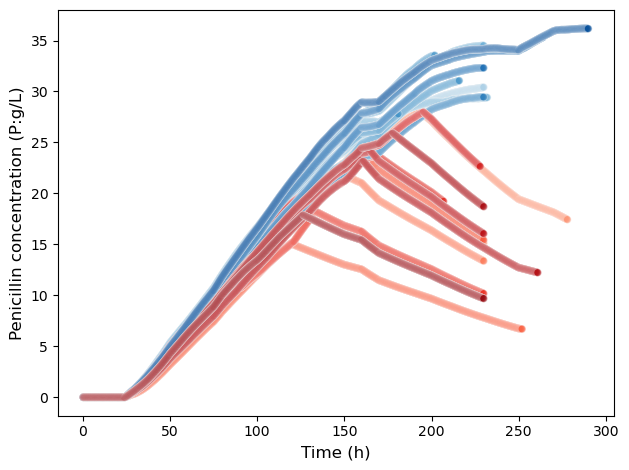

In [28]:
# Visualize penicillin concentration by batch group (low vs high acid flow)
sns.scatterplot(data=df_acid_flow, x='Time (h)', y='Penicillin concentration(P:g/L)', hue='Batch reference(Batch_ref:Batch ref)', palette=color_map, s=30, alpha=0.3, legend=False)
plt.xlabel('Time (h)', fontsize=12)
plt.ylabel('Penicillin concentration (P:g/L)', fontsize=12)
plt.tight_layout()
plt.show()

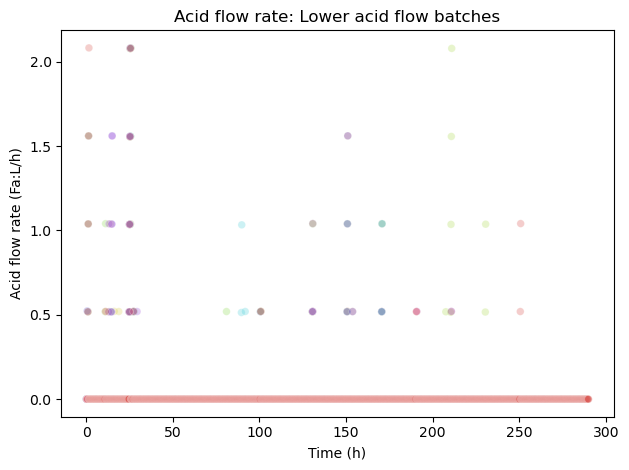

In [29]:
# Acid flow rate for low acid flow batches
sns.scatterplot(data=low_acid_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Acid flow rate: Lower acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Acid flow rate (Fa:L/h)')
plt.tight_layout()
plt.show()

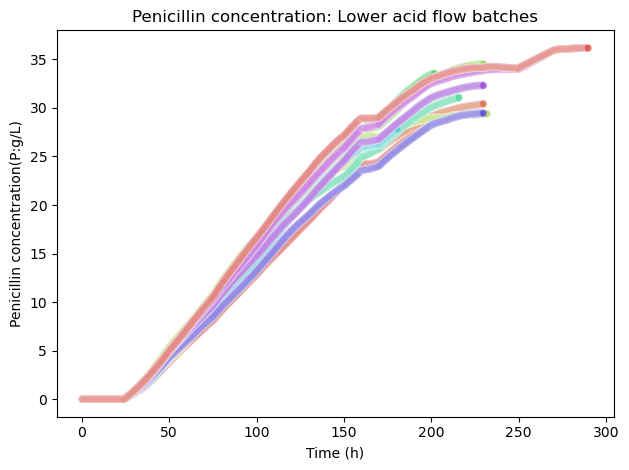

In [30]:
# Penicillin concentration for low acid flow batches
sns.scatterplot(data=low_acid_data, x='Time (h)', y='Penicillin concentration(P:g/L)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Penicillin concentration: Lower acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Penicillin concentration(P:g/L)')
plt.tight_layout()
plt.show()

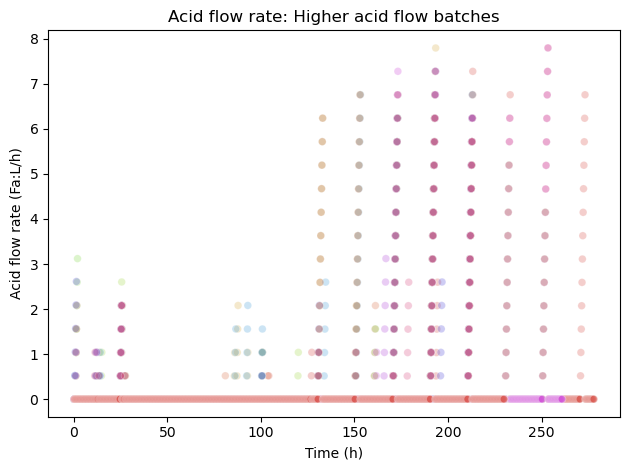

In [31]:
# Acid flow rate for high acid flow batches
sns.scatterplot(data=high_acid_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Acid flow rate: Higher acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Acid flow rate (Fa:L/h)')
plt.tight_layout()
plt.show()

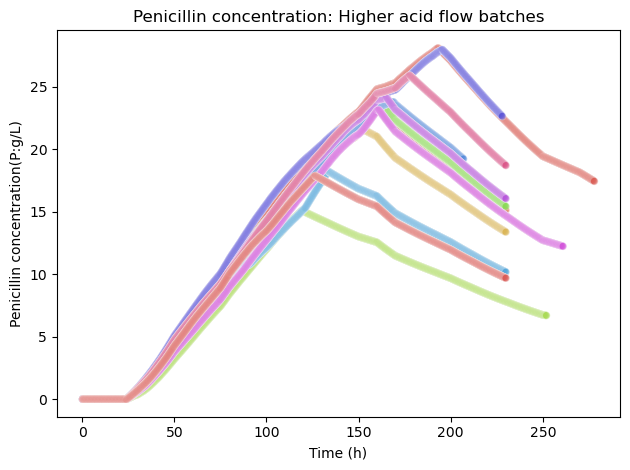

In [32]:
# Penicillin concentration for high acid flow batches
sns.scatterplot(data=high_acid_data, x='Time (h)', y='Penicillin concentration(P:g/L)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Penicillin concentration: Higher acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Penicillin concentration(P:g/L)')
plt.tight_layout()
plt.show()

In [33]:
# Plot acid flow rate and penicillin concentration together for low acid flow batches

low_acid_batch = low_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(low_acid_batch):
    batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    # Add acid flow rate trace (primary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Acid flow rate(Fa:L/h)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=6, opacity=0.5), showlegend=False), secondary_y=False)
    # Add penicillin concentration trace (secondary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Penicillin concentration(P:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), secondary_y=True)
fig.update_layout(title_text='Acid flow rate and Penicillin concentration: Lower acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray', linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Acid flow rate (Fa:L/h)', secondary_y=False, )
fig.update_yaxes(title_text='Penicillin concentration (P:g/L)', secondary_y=True, )
fig.show()

In [34]:
# Plot acid flow rate and pH together for low acid flow batches

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(low_acid_batch):
    batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    # Add acid flow rate trace (primary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Acid flow rate(Fa:L/h)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=6, opacity=0.5), showlegend=False), secondary_y=False)
    # Add pH trace (secondary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['pH(pH:pH)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), secondary_y=True)
fig.update_layout(title_text='Acid flow rate and pH: Lower acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray', linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Acid flow rate (Fa:L/h)', secondary_y=False, )
fig.update_yaxes(title_text='pH (pH:pH)', secondary_y=True, )
fig.show()

In [35]:
# Plot acid flow rate and penicillin concentration together for high acid flow batches

high_acid_batch = high_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(high_acid_batch):
    batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    # Add acid flow rate trace (primary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Acid flow rate(Fa:L/h)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=6, opacity=0.5), showlegend=False), secondary_y=False)
    # Add penicillin concentration trace (secondary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Penicillin concentration(P:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), secondary_y=True)
fig.update_layout(title_text='Acid flow rate and Penicillin concentration: Higher acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Acid flow rate (Fa:L/h)', secondary_y=False, )
fig.update_yaxes(title_text='Penicillin concentration (P:g/L)', secondary_y=True, )
fig.show()

In [36]:
# Plot acid flow rate and pH together for high acid flow batches

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(high_acid_batch):
    batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    # Add acid flow rate trace (primary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Acid flow rate(Fa:L/h)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=6, opacity=0.5), showlegend=False), secondary_y=False)
    # Add pH trace (secondary y-axis)
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['pH(pH:pH)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), secondary_y=True)
fig.update_layout(title_text='Acid flow rate and pH: Higher acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray', linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Acid flow rate (Fa:L/h)', secondary_y=False, )
fig.update_yaxes(title_text='pH (pH:pH)', secondary_y=True, )
fig.show()

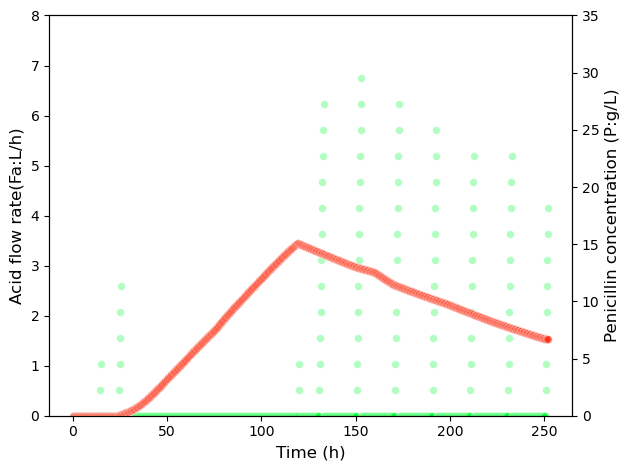

In [37]:
# Batch 9 (high acid flow batch with earliest penicillin decline)
batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == 9]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='Penicillin concentration(P:g/L)', color=color_sequence[0], s=30, alpha=0.3, label='Penicillin concentration', legend=False, ax=ax2)
ax2.set_ylabel('Penicillin concentration (P:g/L)', fontsize=12)
ax2.set_ylim(0,35)
ax2.tick_params(axis='both')
# plt.title('Batch 9 (Higher acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

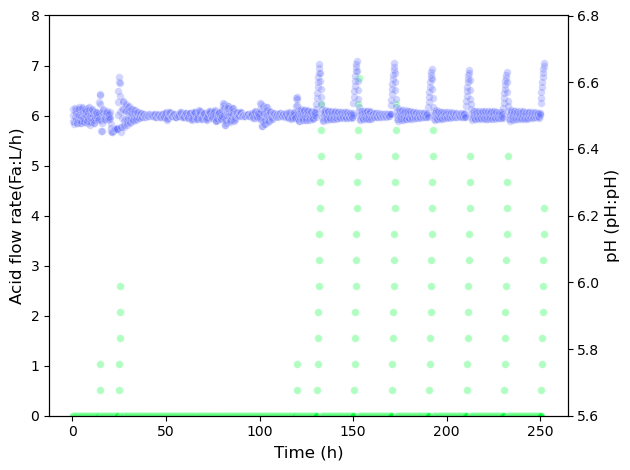

In [38]:
# Batch 9 (high acid flow batch with earliest penicillin decline)
batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == 9]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='pH(pH:pH)', color=color_sequence[2], s=30, alpha=0.3, label='pH', legend=False, ax=ax2)
ax2.set_ylabel('pH (pH:pH)', fontsize=12)
ax2.set_ylim(5.6,6.8)
ax2.tick_params(axis='both')
# plt.title('Batch 9 (Higher acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

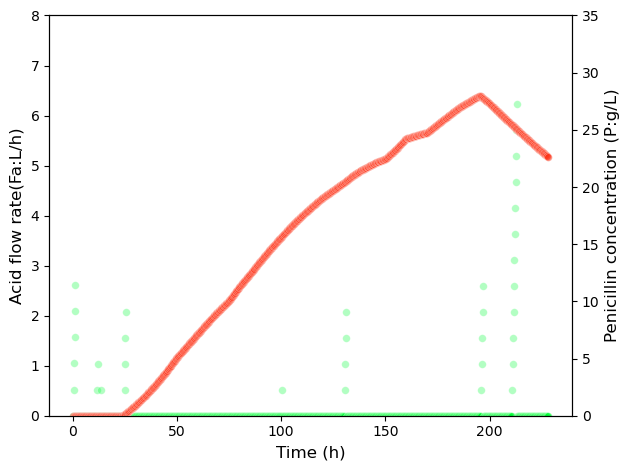

In [39]:
# Batch 21 (high acid flow batch with latest penicillin decline)
batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == 21]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='Penicillin concentration(P:g/L)', color=color_sequence[0], s=30, alpha=0.3, label='Penicillin concentration', legend=False, ax=ax2)
ax2.set_ylabel('Penicillin concentration (P:g/L)', fontsize=12)
ax2.set_ylim(0,35)
ax2.tick_params(axis='both')
# plt.title('Batch 3 (Higher acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

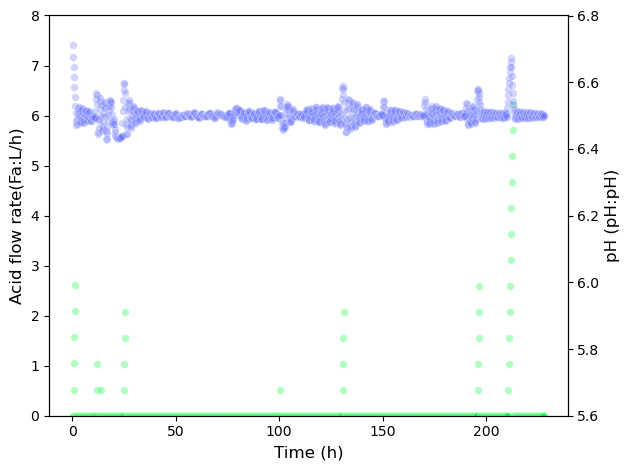

In [40]:
# Batch 21 (high acid flow batch with latest penicillin decline)
batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == 21]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='pH(pH:pH)', color=color_sequence[2], s=30, alpha=0.3, label='pH', legend=False, ax=ax2)
ax2.set_ylabel('pH (pH:pH)', fontsize=12)
ax2.set_ylim(5.6,6.8)
ax2.tick_params(axis='both')
# plt.title('Batch 3 (Higher acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

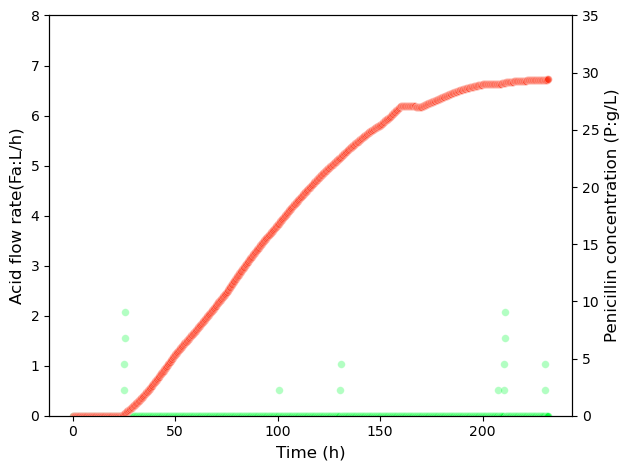

In [41]:
# Batch 7 (lower acid flow batch): Demonstrates continuous penicillin concentration increase despite a significant pH drop.
batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == 7]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='Penicillin concentration(P:g/L)', color=color_sequence[0], s=30, alpha=0.3, label='Penicillin concentration', legend=False, ax=ax2)
ax2.set_ylabel('Penicillin concentration (P:g/L)', fontsize=12)
ax2.set_ylim(0,35)
ax2.tick_params(axis='both')
# plt.title('Batch 7 (Lower acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

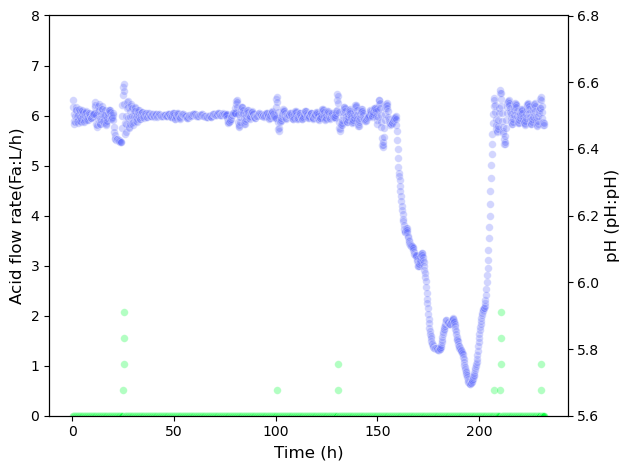

In [42]:
# Batch 7 (lower acid flow batch): Demonstrates continuous penicillin concentration increase despite a significant pH drop.
batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == 7]

fig, ax1 = plt.subplots()
sns.scatterplot(data=batch_data, x='Time (h)', y='Acid flow rate(Fa:L/h)', color=color_sequence[1], s=30, alpha=0.3, label='Acid flow rate', legend=False, ax=ax1)
ax1.set_ylabel('Acid flow rate(Fa:L/h)', fontsize=12)
ax1.set_xlabel('Time (h)', fontsize=12)
ax1.set_ylim(0,8)
ax1.tick_params(axis='both')
ax2 = ax1.twinx()
sns.scatterplot(data=batch_data, x='Time (h)', y='pH(pH:pH)', color=color_sequence[2], s=30, alpha=0.3, label='pH', legend=False, ax=ax2)
ax2.set_ylabel('pH (pH:pH)', fontsize=12)
ax2.set_ylim(5.6,6.8)
ax2.tick_params(axis='both')
# plt.title('Batch 7 (Lower acid flow batch)', fontsize=14, pad=20)
# lines1, labels1 = ax1.get_legend_handles_labels()
# lines2, labels2 = ax2.get_legend_handles_labels()
# ax1.legend(lines1+lines2, labels1+labels2, loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

### 5.4 Analysis of substrate concentration, sugar feed rate, and oil flow

In [43]:
# Calculate summary statistics for substrate concentration by batch group (low vs high acid flow)
batch_summary = df_acid_flow.groupby('Acid flow group')['Substrate concentration(S:g/L)'].describe().drop(columns='count')
batch_summary

,mean,std,min,25%,50%,75%,max
Acid flow group,,,,,,,
High acid flow,9.040524,16.886953,0.000109,0.001061,0.002405,10.877750,83.9560
Low acid flow,0.093679,0.404672,0.000286,0.001040,0.001432,0.002159,3.1071


In [44]:
# Calculate summary statistics for substrate concentration for low acid flow batches
batch_summary = low_acid_data.groupby('Batch reference(Batch_ref:Batch ref)')['Substrate concentration(S:g/L)'].describe().drop(columns='count')
batch_summary

,mean,std,min,25%,50%,75%,max
Batch reference(Batch_ref:Batch ref),,,,,,,
1.0,0.079221,0.338602,0.000597,0.001197,0.001465,0.002028,1.9325
2.0,0.091528,0.393516,0.000293,0.000918,0.001341,0.002154,2.2271
5.0,0.131868,0.488204,0.000449,0.000946,0.001178,0.002779,2.4462
7.0,0.060593,0.276522,0.000417,0.000957,0.001360,0.002126,1.6604
8.0,0.064266,0.299885,0.000286,0.000842,0.001307,0.002107,1.7917
11.0,0.075193,0.311857,0.000506,0.000961,0.001305,0.002375,1.7255
13.0,0.105138,0.420583,0.000384,0.000862,0.001700,0.002456,2.2916
15.0,0.197007,0.663168,0.000519,0.001007,0.001279,0.002528,3.1071
20.0,0.120143,0.492899,0.000632,0.001192,0.001638,0.002016,2.7155


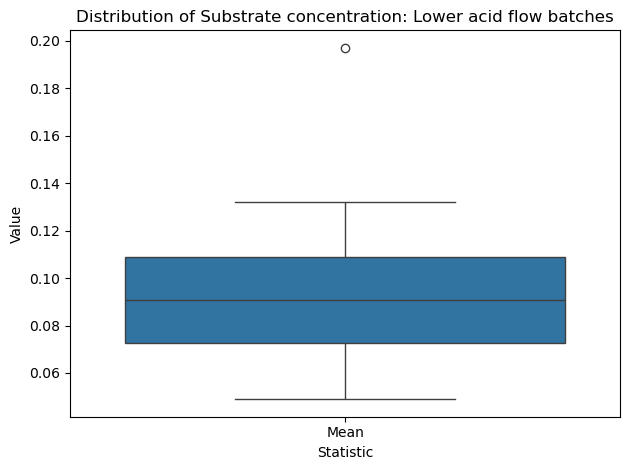

In [45]:
# Visualize the distribution of mean substrate concentration across batches
summary = pd.DataFrame({'Mean': batch_summary['mean'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Substrate concentration: Lower acid flow batches')
plt.tight_layout()
plt.show()

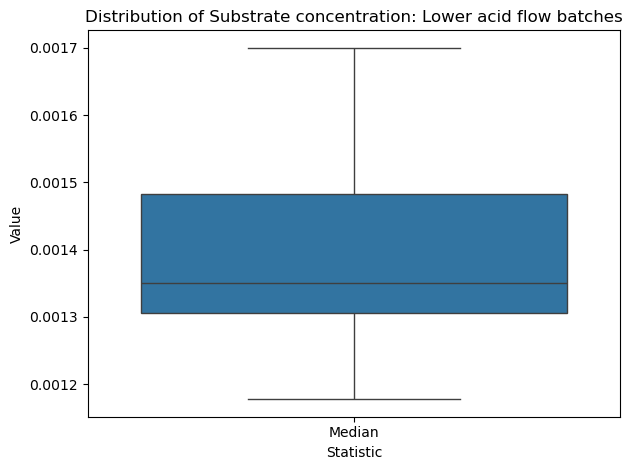

In [46]:
# Visualize the distribution of median substrate concentration across batches
summary = pd.DataFrame({'Median': batch_summary['50%'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Substrate concentration: Lower acid flow batches')
plt.tight_layout()
plt.show()

In [47]:
# Calculate summary statistics for substrate concentration for high acid flow batches
batch_summary = high_acid_data.groupby('Batch reference(Batch_ref:Batch ref)')['Substrate concentration(S:g/L)'].describe().drop(columns='count')
batch_summary

,mean,std,min,25%,50%,75%,max
Batch reference(Batch_ref:Batch ref),,,,,,,
3.0,8.260405,15.171254,0.000538,0.000972,0.002086,10.038250,56.757
4.0,6.574567,12.075182,0.000509,0.000972,0.002376,6.919850,42.947
6.0,7.608371,12.758660,0.000345,0.001027,0.002784,11.253000,43.936
9.0,21.845887,27.418139,0.000703,0.002201,3.183000,43.624000,83.956
10.0,6.785646,12.198412,0.000495,0.000924,0.002169,8.006050,41.933
18.0,12.728496,18.802908,0.000452,0.001860,0.041697,23.302000,61.573
19.0,2.093275,5.070300,0.000491,0.000898,0.001798,0.027478,22.836
21.0,1.638090,4.547515,0.000109,0.000851,0.001293,0.002554,22.020
24.0,6.094973,11.741217,0.000477,0.000854,0.002240,4.540400,43.364


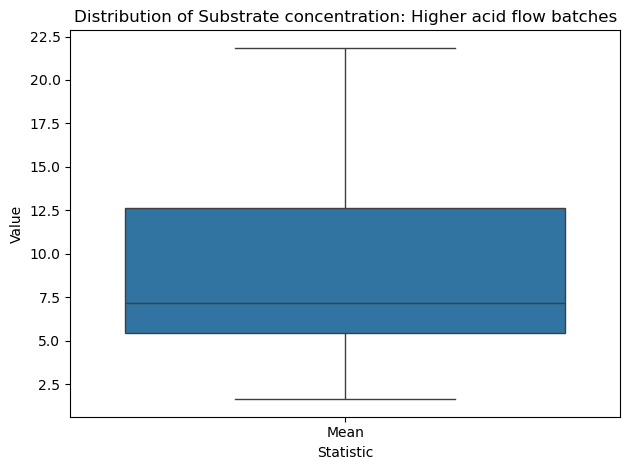

In [48]:
# Visualize the distribution of mean substrate concentration across batches
summary = pd.DataFrame({'Mean': batch_summary['mean'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Substrate concentration: Higher acid flow batches')
plt.tight_layout()
plt.show()

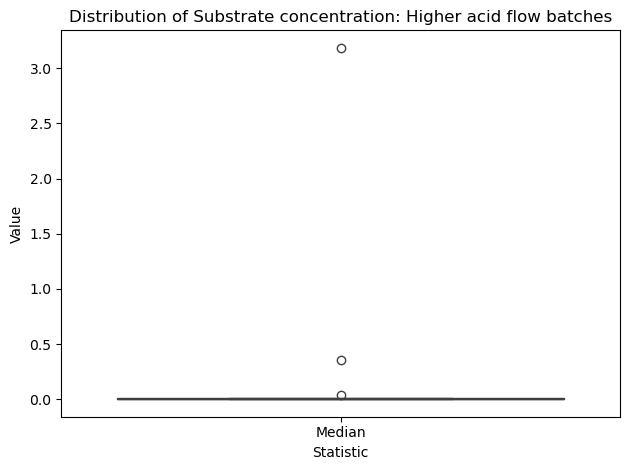

In [49]:
# Visualize the distribution of median substrate concentration across batches
summary = pd.DataFrame({'Median': batch_summary['50%'].values}).melt(var_name='Statistic', value_name='Value')
sns.boxplot(data=summary, x='Statistic', y='Value')
plt.title('Distribution of Substrate concentration: Higher acid flow batches')
plt.tight_layout()
plt.show()

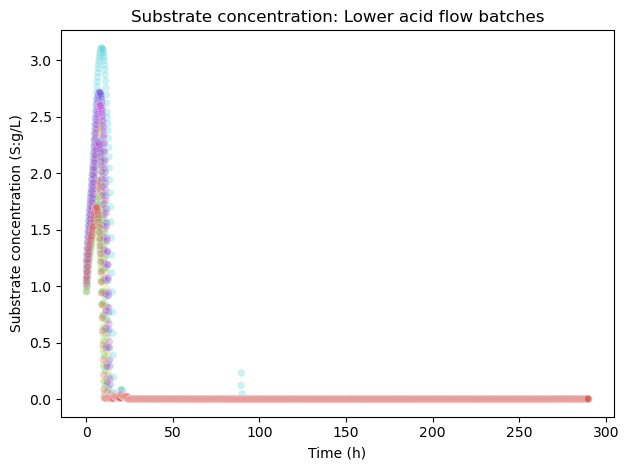

In [50]:
# Substrate concentration for low acid flow batches
sns.scatterplot(data=low_acid_data, x='Time (h)', y='Substrate concentration(S:g/L)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Substrate concentration: Lower acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Substrate concentration (S:g/L)')
plt.tight_layout()
plt.show()

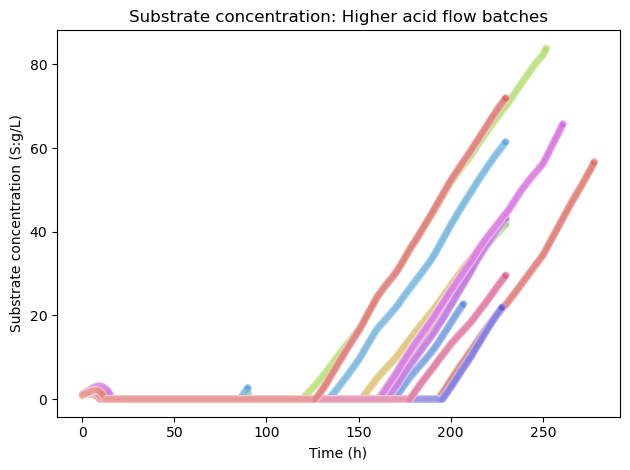

In [51]:
# Substrate concentration for high acid flow batches
sns.scatterplot(data=high_acid_data, x='Time (h)', y='Substrate concentration(S:g/L)', hue='Batch reference(Batch_ref:Batch ref)', palette='hls', s=30, alpha=0.3, legend=False)
plt.title('Substrate concentration: Higher acid flow batches')
plt.xlabel('Time (h)')
plt.ylabel('Substrate concentration (S:g/L)')
plt.tight_layout()
plt.show()

In [52]:
# Plot substrate concentration for low acid flow batches

low_acid_batch = low_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(low_acid_batch):
    batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Substrate concentration(S:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False))
fig.update_layout(title_text='Substrate concentration: Lower acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray', linecolor='black', mirror=True),) 
fig.update_yaxes(title_text='Substrate concentration (S:g/L)',)
fig.show()

In [53]:
# Plot substrate concentration for high acid flow batches

high_acid_batch = high_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()

fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

for i, batch in enumerate(high_acid_batch):
    batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Substrate concentration(S:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False))
fig.update_layout(title_text='Substrate concentration: Higher acid flow batches', xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=True, gridcolor='lightgray', linecolor='black', mirror=True),) 
fig.update_yaxes(title_text='Substrate concentration (S:g/L)',)
fig.show()

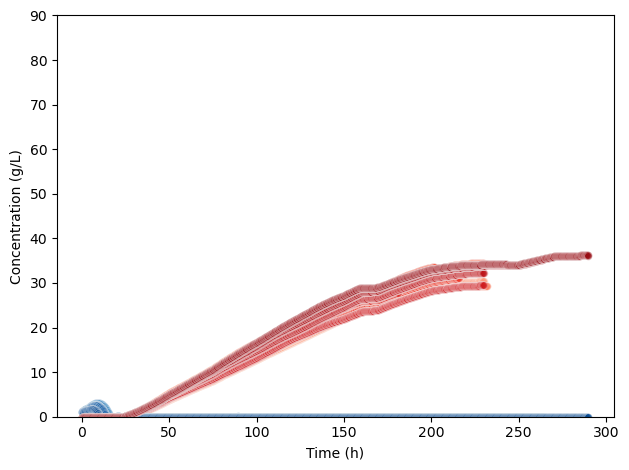

In [54]:
# Plot substrate concentration and penicillin concentration together for low acid flow batches

batch = low_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()
blue_palette = plt.cm.Blues(np.linspace(0.3,0.9,len(batch)))
red_palette = plt.cm.Reds(np.linspace(0.3,0.9,len(batch)))

for i, n in enumerate(batch):
    batch_data = low_acid_data[low_acid_data['Batch reference(Batch_ref:Batch ref)'] == n]
    sns.scatterplot(data=batch_data, x='Time (h)', y='Substrate concentration(S:g/L)', color=blue_palette[i], s=30, alpha=0.3, label='Substrate concentration', legend=False)
    sns.scatterplot(data=batch_data, x='Time (h)', y='Penicillin concentration(P:g/L)', color=red_palette[i], s=30, alpha=0.3, label='Penicillin concentration', legend=False)
plt.xlabel('Time (h)')
plt.ylabel('Concentration (g/L)')
plt.ylim(0,90)
plt.tight_layout()
plt.show()

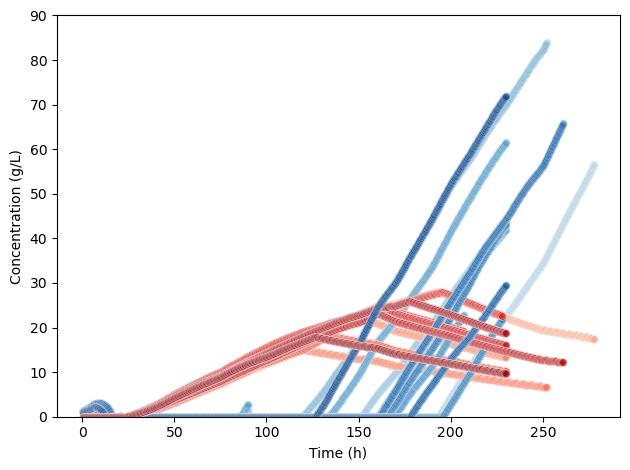

In [55]:
# Plot substrate concentration and penicillin concentration together for high acid flow batches

batch = high_acid_data['Batch reference(Batch_ref:Batch ref)'].unique()
blue_palette = plt.cm.Blues(np.linspace(0.3,0.9,len(batch)))
red_palette = plt.cm.Reds(np.linspace(0.3,0.9,len(batch)))

for i, n in enumerate(batch):
    batch_data = high_acid_data[high_acid_data['Batch reference(Batch_ref:Batch ref)'] == n]
    sns.scatterplot(data=batch_data, x='Time (h)', y='Substrate concentration(S:g/L)', color=blue_palette[i], s=30, alpha=0.3, label='Substrate concentration', legend=False)
    sns.scatterplot(data=batch_data, x='Time (h)', y='Penicillin concentration(P:g/L)', color=red_palette[i], s=30, alpha=0.3, label='Penicillin concentration', legend=False)
plt.xlabel('Time (h)')
plt.ylabel('Concentration (g/L)')
plt.ylim(0,90)
plt.tight_layout()
plt.show()

In [56]:
# Categozie data into two metabolic phases: Phase 1 (Growth phase), Phase 2 (Production phase)
low_acid_data_phase1 = low_acid_data[low_acid_data['Time (h)'] <= 24.0]
low_acid_data_phase2 = low_acid_data[low_acid_data['Time (h)'] > 24.0]

In [57]:
fig = make_subplots(specs=[[{'secondary_y': True}]])

fig.add_trace(go.Scatter(x=low_acid_data_phase1['Time (h)'], y=low_acid_data_phase1['Sugar feed rate(Fs:L/h)'], mode='markers', name='Sugar flow(Fs:L/h)', marker=dict( size=6, opacity=0.5), showlegend=True), secondary_y=False)
fig.add_trace(go.Scatter(x=low_acid_data_phase1['Time (h)'], y=low_acid_data_phase1['Oil flow(Foil:L/hr)'], mode='markers', name='Oil flow(Foil:L/h)', marker=dict(size=6, opacity=0.5), showlegend=True), secondary_y=False)
fig.add_trace(go.Scatter(x=low_acid_data_phase1['Time (h)'], y=low_acid_data_phase1['Substrate concentration(S:g/L)'], mode='markers', name='Substrate(S:g/L)', marker=dict(size=4, opacity=0.5), showlegend=True), secondary_y=True)
fig.add_trace(go.Scatter(x=low_acid_data_phase1['Time (h)'], y=low_acid_data_phase1['Penicillin concentration(P:g/L)'], mode='markers', name='Penicillin(P:g/L)', marker=dict(size=4, opacity=0.5), showlegend=True), secondary_y=True)
fig.update_layout(xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Flow rate (L/h)', secondary_y=False, )
fig.update_yaxes(title_text='Concentration (g/L)', secondary_y=True, )
fig.show()

In [58]:
fig = make_subplots(specs=[[{'secondary_y': True}]])

fig.add_trace(go.Scatter(x=low_acid_data_phase2['Time (h)'], y=low_acid_data_phase2['Sugar feed rate(Fs:L/h)'], mode='markers', name='Sugar flow(Fs:L/h)', marker=dict( size=6, opacity=0.5), showlegend=True), secondary_y=False)
fig.add_trace(go.Scatter(x=low_acid_data_phase2['Time (h)'], y=low_acid_data_phase2['Oil flow(Foil:L/hr)'], mode='markers', name='Oil flow(Foil:L/h)', marker=dict(size=6, opacity=0.5), showlegend=True), secondary_y=False)
fig.add_trace(go.Scatter(x=low_acid_data_phase2['Time (h)'], y=low_acid_data_phase2['Substrate concentration(S:g/L)'], mode='markers', name='Substrate(S:g/L)', marker=dict(size=4, opacity=0.5), showlegend=True), secondary_y=True)
fig.add_trace(go.Scatter(x=low_acid_data_phase2['Time (h)'], y=low_acid_data_phase2['Penicillin concentration(P:g/L)'], mode='markers', name='Penicillin(P:g/L)', marker=dict(size=4, opacity=0.5), showlegend=True), secondary_y=True)
fig.update_layout(xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True),
                  yaxis2=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Flow rate (L/h)', secondary_y=False, )
fig.update_yaxes(title_text='Concentration (g/L)', secondary_y=True, )
fig.show()

In [59]:
fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

low_acid_batch = low_acid_data_phase1['Batch reference(Batch_ref:Batch ref)'].unique()

for i, batch in enumerate(low_acid_batch):
    batch_data = low_acid_data_phase1[low_acid_data_phase1['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Substrate concentration(S:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), )
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Penicillin concentration(P:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), )
fig.update_layout(xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Concentration (g/L)')
fig.show()

In [60]:
fig = make_subplots(specs=[[{'secondary_y': True}]])
color_sequence = px.colors.qualitative.Light24

low_acid_batch = low_acid_data_phase2['Batch reference(Batch_ref:Batch ref)'].unique()

for i, batch in enumerate(low_acid_batch):
    batch_data = low_acid_data_phase2[low_acid_data_phase2['Batch reference(Batch_ref:Batch ref)'] == batch]
    batch_color = color_sequence[i % len(color_sequence)]
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Substrate concentration(S:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), )
    fig.add_trace(go.Scatter(x=batch_data['Time (h)'], y=batch_data['Penicillin concentration(P:g/L)'], mode='markers', name=f'Batch {batch}', marker=dict(color=batch_color, size=4, opacity=0.5), showlegend=False), )
fig.update_layout(xaxis_title='Time (h)', title_x=0.5, plot_bgcolor='white', height=600, width=800,
                  xaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True), 
                  yaxis=dict(showline=True, showgrid=False, linecolor='black', mirror=True)) 
fig.update_yaxes(title_text='Concentration (g/L)')
fig.show()

In [61]:
# Piecewise regression test for one batch
batch_data = low_acid_data_phase2[low_acid_data_phase2['Batch reference(Batch_ref:Batch ref)'] == 29]
time = batch_data['Time (h)'].values
penicillin = batch_data['Penicillin concentration(P:g/L)'].values

pw_fit = piecewise_regression.Fit(time, penicillin, n_breakpoints=1)
pw_fit.summary()


                    Breakpoint Regression Results                     
No. Observations                     1330
No. Model Parameters                    4
Degrees of Freedom                   1326
Res. Sum of Squares               379.292
Total Sum of Squares          1.73207e+05
R Squared                        0.997810
Adjusted R Squared               0.997804
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -6.03901       0.0524      -115.34           0.0      -6.1417      -5.9363
alpha1              0.224478     0.000524       428.75           0.0      0.22345       0.2255
beta1              -0.169668     0.000765       -221.8             -     -0.17117     -0.16817
breakpoint1          159.848        0.346            -             -       159.17       160.53
-----------------

'\n                    Breakpoint Regression Results                     \n====================================================================================================\nNo. Observations                     1330\nNo. Model Parameters                    4\nDegrees of Freedom                   1326\nRes. Sum of Squares               379.292\nTotal Sum of Squares          1.73207e+05\nR Squared                        0.997810\nAdjusted R Squared               0.997804\nConverged:                           True\n====================================================================================================\n====================================================================================================\n                    Estimate      Std Err            t        P>|t|       [0.025       0.975]\n----------------------------------------------------------------------------------------------------\nconst               -6.03901       0.0524      -115.34           0.0      -6.1

Processing Batch 1.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1010
No. Model Parameters                    4
Degrees of Freedom                   1006
Res. Sum of Squares               76.5051
Total Sum of Squares              90716.8
R Squared                        0.999157
Adjusted R Squared               0.999153
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.23625       0.0267       -195.8           0.0      -5.2887      -5.1838
alpha1              0.181901     0.000265       687.24           0.0      0.18138      0.18242
beta1             -0.0849655     0.000868      -97.887             -    -0.086669    -0.083262
breakpoint1          161.786        0.438            -             -       160.93      

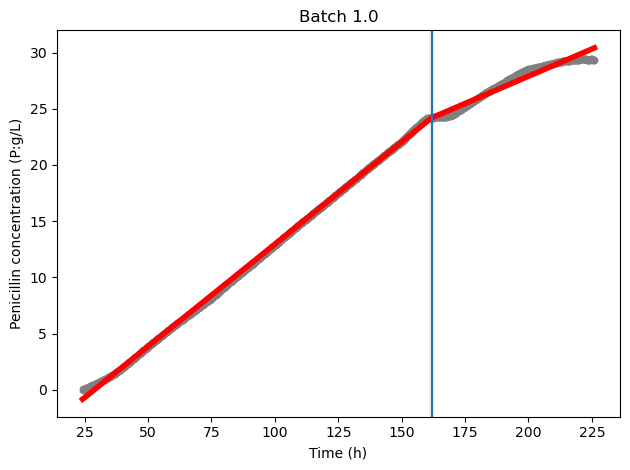

Processing Batch 2.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1030
No. Model Parameters                    4
Degrees of Freedom                   1026
Res. Sum of Squares               77.6155
Total Sum of Squares              95045.5
R Squared                        0.999183
Adjusted R Squared               0.999180
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.86486       0.0309      -189.64           0.0      -5.9255      -5.8042
alpha1              0.211502     0.000357       593.08           0.0       0.2108       0.2122
beta1              -0.123065     0.000592      -208.02             -     -0.12423      -0.1219
breakpoint1          136.748         0.28            -             -        136.2      

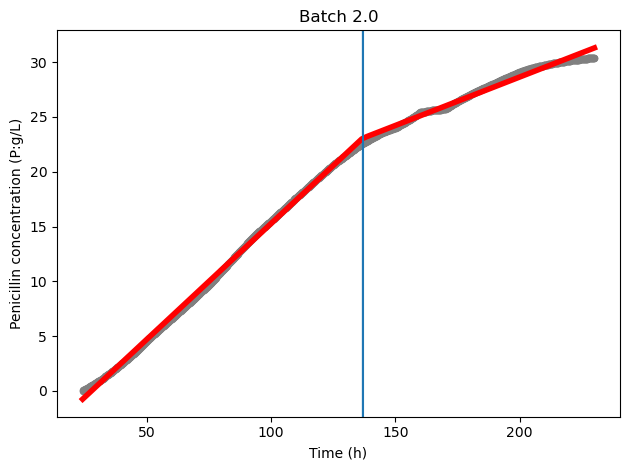

Processing Batch 5.0 ...

                    Breakpoint Regression Results                     
No. Observations                      775
No. Model Parameters                    4
Degrees of Freedom                    771
Res. Sum of Squares               54.2901
Total Sum of Squares              58826.6
R Squared                        0.999077
Adjusted R Squared               0.999072
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -6.01496       0.0292       -205.9           0.0      -6.0723      -5.9576
alpha1              0.206643      0.00033       626.39           0.0        0.206      0.20729
beta1             -0.0777803      0.00171      -45.561             -    -0.081132    -0.074429
breakpoint1          139.843        0.565            -             -       138.73      

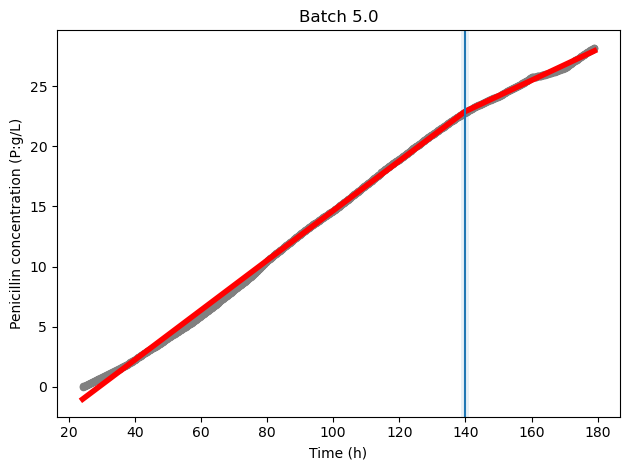

Processing Batch 7.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1040
No. Model Parameters                    4
Degrees of Freedom                   1036
Res. Sum of Squares               145.747
Total Sum of Squares              93169.3
R Squared                        0.998436
Adjusted R Squared               0.998430
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.46351       0.0403      -135.72           0.0      -5.5425      -5.3845
alpha1              0.217101     0.000443       489.92           0.0      0.21623      0.21797
beta1              -0.167668      0.00083      -202.07             -      -0.1693     -0.16604
breakpoint1          143.896        0.281            -             -       143.35      

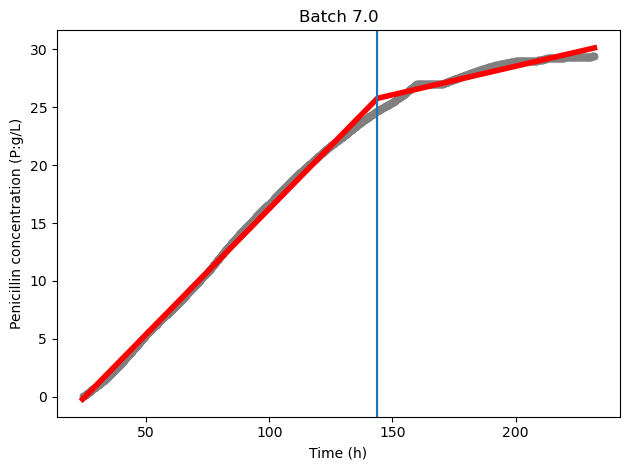

Processing Batch 8.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1030
No. Model Parameters                    4
Degrees of Freedom                   1026
Res. Sum of Squares                122.17
Total Sum of Squares          1.21636e+05
R Squared                        0.998996
Adjusted R Squared               0.998992
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const                -6.0996       0.0374      -163.26           0.0      -6.1729      -6.0263
alpha1              0.221055     0.000415       532.74           0.0      0.22024      0.22187
beta1               -0.10314     0.000773      -133.45             -     -0.10466     -0.10162
breakpoint1          142.467        0.422            -             -       141.64      

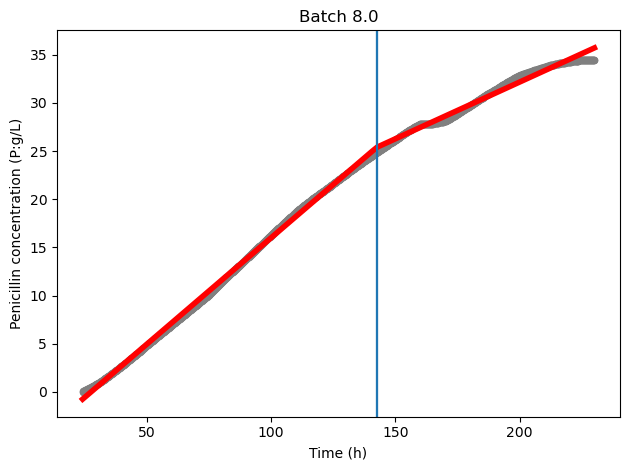

Processing Batch 11.0 ...

                    Breakpoint Regression Results                     
No. Observations                      890
No. Model Parameters                    4
Degrees of Freedom                    886
Res. Sum of Squares               26.8205
Total Sum of Squares              93549.0
R Squared                        0.999713
Adjusted R Squared               0.999712
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const                -5.8897       0.0193      -305.89           0.0      -5.9275      -5.8519
alpha1              0.215691     0.000219       986.86           0.0      0.21526      0.21612
beta1             -0.0577575     0.000582      -99.298             -    -0.058899    -0.056616
breakpoint1          139.073        0.422            -             -       138.24     

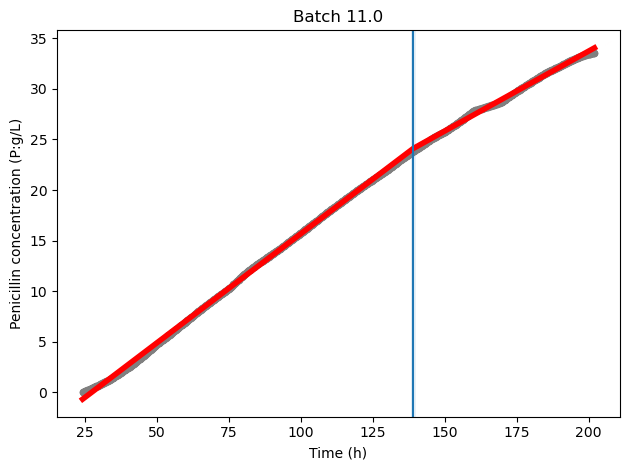

Processing Batch 13.0 ...

                    Breakpoint Regression Results                     
No. Observations                      960
No. Model Parameters                    4
Degrees of Freedom                    956
Res. Sum of Squares               48.3272
Total Sum of Squares              85278.9
R Squared                        0.999433
Adjusted R Squared               0.999431
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const                -5.7641       0.0302      -191.05           0.0      -5.8233      -5.7049
alpha1              0.212108     0.000409        518.2           0.0      0.21131      0.21291
beta1             -0.0787896      0.00053      -148.58             -     -0.07983    -0.077749
breakpoint1          113.848        0.369            -             -       113.12     

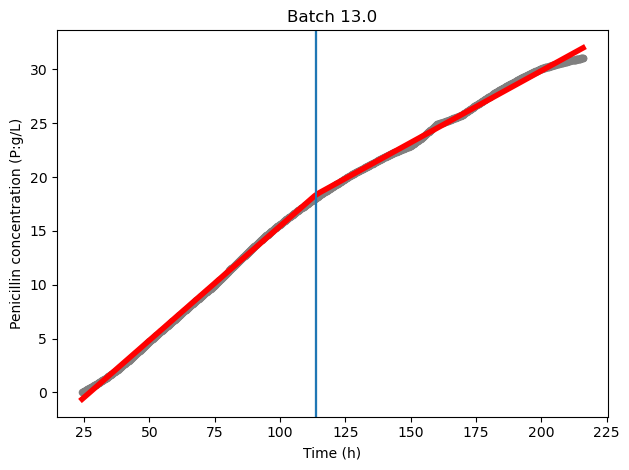

Processing Batch 15.0 ...

                    Breakpoint Regression Results                     
No. Observations                      785
No. Model Parameters                    4
Degrees of Freedom                    781
Res. Sum of Squares               37.3299
Total Sum of Squares              60192.3
R Squared                        0.999380
Adjusted R Squared               0.999377
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.91229       0.0226      -261.56           0.0      -5.9567      -5.8679
alpha1              0.204045     0.000239       852.07           0.0      0.20357      0.20452
beta1               -0.11203      0.00198      -56.669             -     -0.11591     -0.10815
breakpoint1          150.045        0.351            -             -       149.36     

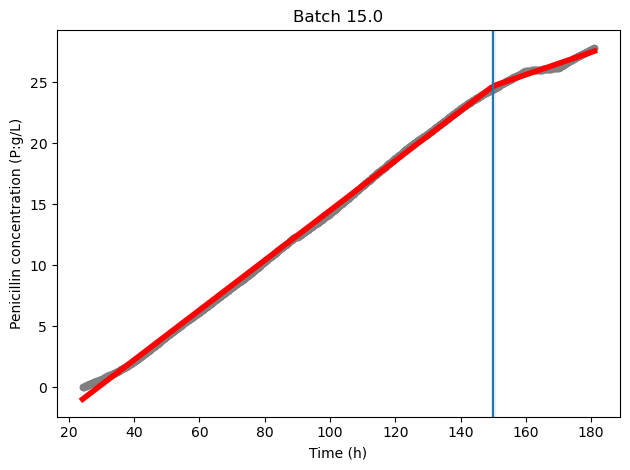

Processing Batch 20.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1030
No. Model Parameters                    4
Degrees of Freedom                   1026
Res. Sum of Squares               99.1984
Total Sum of Squares              89431.3
R Squared                        0.998891
Adjusted R Squared               0.998886
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -4.94191       0.0322      -153.36           0.0      -5.0051      -4.8787
alpha1              0.182796     0.000342       534.15           0.0      0.18212      0.18347
beta1             -0.0808872     0.000751      -107.74             -     -0.08236    -0.079414
breakpoint1          149.748        0.491            -             -       148.78     

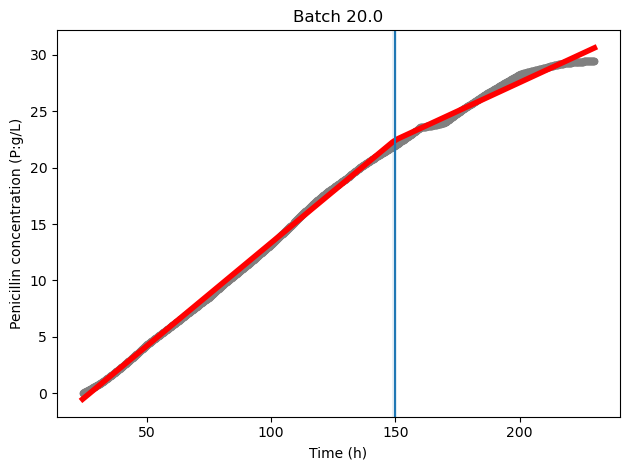

Processing Batch 22.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1030
No. Model Parameters                    4
Degrees of Freedom                   1026
Res. Sum of Squares               72.2091
Total Sum of Squares          1.07154e+05
R Squared                        0.999326
Adjusted R Squared               0.999323
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.07048       0.0263      -192.94           0.0       -5.122      -5.0189
alpha1              0.198077     0.000266       744.24           0.0      0.19755       0.1986
beta1             -0.0984072     0.000718       -137.0             -    -0.099817    -0.096998
breakpoint1          157.639        0.352            -             -       156.95     

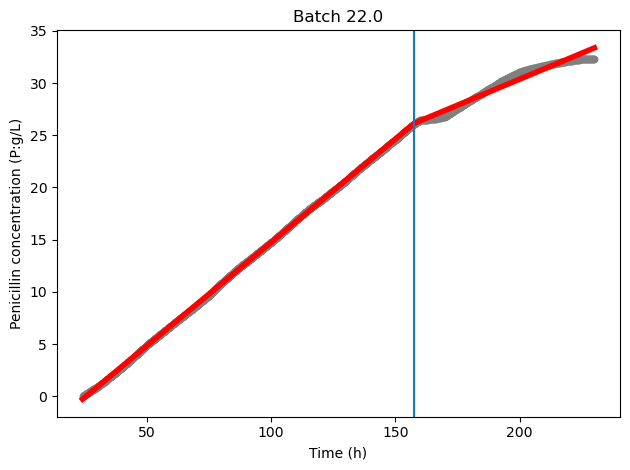

Processing Batch 23.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1200
No. Model Parameters                    4
Degrees of Freedom                   1196
Res. Sum of Squares               306.439
Total Sum of Squares          1.49341e+05
R Squared                        0.997948
Adjusted R Squared               0.997941
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -5.54835       0.0483      -114.91           0.0      -5.6431      -5.4536
alpha1              0.211607     0.000469       450.84           0.0      0.21069      0.21253
beta1              -0.147134     0.000922      -159.57             -     -0.14894     -0.14533
breakpoint1          164.893        0.403            -             -        164.1     

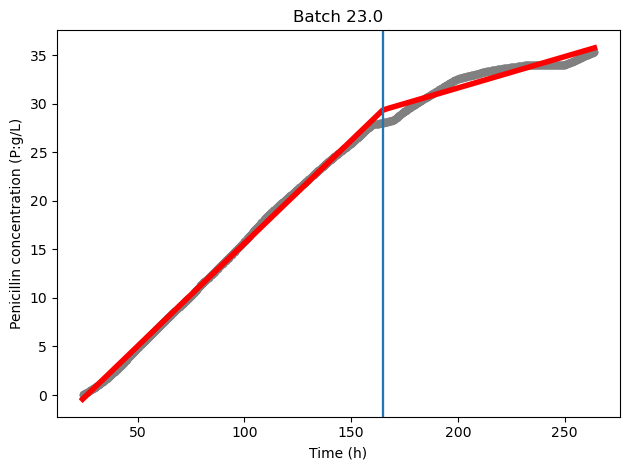

Processing Batch 29.0 ...

                    Breakpoint Regression Results                     
No. Observations                     1330
No. Model Parameters                    4
Degrees of Freedom                   1326
Res. Sum of Squares               379.292
Total Sum of Squares          1.73207e+05
R Squared                        0.997810
Adjusted R Squared               0.997804
Converged:                           True
                    Estimate      Std Err            t        P>|t|       [0.025       0.975]
----------------------------------------------------------------------------------------------------
const               -6.03901       0.0524      -115.34           0.0      -6.1417      -5.9363
alpha1              0.224478     0.000524       428.75           0.0      0.22345       0.2255
beta1              -0.169668     0.000765       -221.8             -     -0.17117     -0.16817
breakpoint1          159.848        0.346            -             -       159.17     

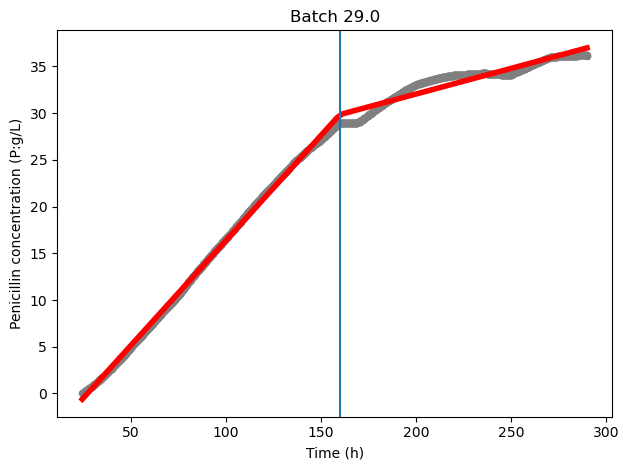

In [62]:
# Initialize a dictionary to store results
results = {'Batch': [], 'Inital rate (g/L/h)': [], 'Initial rate CI lower': [], 'Initial rate CI upper': [], 'Initial rate p-value': [], 
           'Final rate (g/L/h)': [], 'Final rate CI lower': [], 'Final rate CI upper': [], 'Final rate p-value': [],
           'Breakpoint (h)': [], 'Breakpoint CI lower': [], 'Breakpoint CI upper': [],
           'Adjusted R Squared': [], 'Davies test p-value': []
           }

# Get unique batch identifiers
low_acid_batch = low_acid_data_phase2['Batch reference(Batch_ref:Batch ref)'].unique()

# Process each batch
for batch in low_acid_batch:
    print(f"Processing Batch {batch} ...")

    # Extract data for this batch
    batch_data = low_acid_data_phase2[low_acid_data_phase2['Batch reference(Batch_ref:Batch ref)'] == batch]
    # Get time and penicillin values
    time = batch_data['Time (h)'].values
    penicillin = batch_data['Penicillin concentration(P:g/L)'].values
    # Apply piecewise regression with one breakpoint
    pw_fit = piecewise_regression.Fit(time, penicillin, n_breakpoints=1)
    pw_summary = pw_fit.summary()
    pw_results = pw_fit.get_results()
    pw_estimates = pw_results["estimates"]
    pw_davies = pw_results["davies"]
    # Extract Adjusted R squared from summary
    adj_r2 = None
    for line in pw_summary.split('\n'):
        if "Adjusted R Squared" in line:
            adj_r2 = float(line.split()[-1])
            break
    
    # Store results in the dictionary
    results['Batch'].append(batch)
    results['Inital rate (g/L/h)'].append(pw_estimates['alpha1']['estimate'])
    results['Initial rate CI lower'].append(pw_estimates['alpha1']['confidence_interval'][0])
    results['Initial rate CI upper'].append(pw_estimates['alpha1']['confidence_interval'][1])
    results['Initial rate p-value'].append(pw_estimates['alpha1']['p_t'])
    results['Final rate (g/L/h)'].append(pw_estimates['alpha2']['estimate'])
    results['Final rate CI lower'].append(pw_estimates['alpha2']['confidence_interval'][0])
    results['Final rate CI upper'].append(pw_estimates['alpha2']['confidence_interval'][1])
    results['Final rate p-value'].append(pw_estimates['alpha2']['p_t'])
    results['Breakpoint (h)'].append(pw_estimates['breakpoint1']['estimate'])
    results['Breakpoint CI lower'].append(pw_estimates['breakpoint1']['confidence_interval'][0])
    results['Breakpoint CI upper'].append(pw_estimates['breakpoint1']['confidence_interval'][1])
    results['Adjusted R Squared'].append(adj_r2)
    results['Davies test p-value'].append(pw_davies)
    
    # Plot the data, fit, breakpoints and confidence intervals
    pw_fit.plot_data(color='grey', s=20)
    pw_fit.plot_fit(color='red', linewidth=4)
    pw_fit.plot_breakpoints()
    pw_fit.plot_breakpoint_confidence_intervals()
    plt.title(f"Batch {batch}")
    plt.xlabel("Time (h)")
    plt.ylabel("Penicillin concentration (P:g/L)")
    plt.tight_layout()
    plt.show()

# Convert results to DataFrame
piecewise_df = pd.DataFrame(results).sort_values('Inital rate (g/L/h)', ascending=True)

In [63]:
piecewise_df

,Batch,Inital rate (g/L/h),Initial rate CI lower,Initial rate CI upper,Initial rate p-value,Final rate (g/L/h),Final rate CI lower,Final rate CI upper,Final rate p-value,Breakpoint (h),Breakpoint CI lower,Breakpoint CI upper,Adjusted R Squared,Davies test p-value
0,1.0,0.181901,0.181382,0.182420,0.0,0.096936,0.095313,0.098558,0.000000e+00,161.785506,160.926325,162.644687,0.999153,0.0
8,20.0,0.182796,0.182125,0.183468,0.0,0.101909,0.100598,0.103220,0.000000e+00,149.747626,148.784291,150.710961,0.998886,0.0
9,22.0,0.198077,0.197555,0.198599,0.0,0.099670,0.098361,0.100979,0.000000e+00,157.639237,156.948339,158.330135,0.999323,0.0
7,15.0,0.204045,0.203575,0.204515,0.0,0.092015,0.088163,0.095868,2.725558e-229,150.044597,149.356256,150.732939,0.999377,0.0
2,5.0,0.206643,0.205996,0.207291,0.0,0.128863,0.125575,0.132151,0.000000e+00,139.842589,138.734073,140.951105,0.999072,0.0
1,2.0,0.211502,0.210803,0.212202,0.0,0.088438,0.087511,0.089364,0.000000e+00,136.747932,136.199014,137.296849,0.999180,0.0
10,23.0,0.211607,0.210686,0.212528,0.0,0.064472,0.062915,0.066030,0.000000e+00,164.892867,164.101482,165.684253,0.997941,0.0
6,13.0,0.212108,0.211305,0.212912,0.0,0.133319,0.132657,0.133980,0.000000e+00,113.848103,113.123695,114.572512,0.999431,0.0
5,11.0,0.215691,0.215262,0.216120,0.0,0.157933,0.156875,0.158991,0.000000e+00,139.073272,138.244163,139.902381,0.999712,0.0
3,7.0,0.217101,0.216232,0.217971,0.0,0.049434,0.048057,0.050810,0.000000e+00,143.896174,143.345305,144.447042,0.998430,0.0


In [64]:
piecewise_df.sort_values('Breakpoint (h)', ascending=True)

,Batch,Inital rate (g/L/h),Initial rate CI lower,Initial rate CI upper,Initial rate p-value,Final rate (g/L/h),Final rate CI lower,Final rate CI upper,Final rate p-value,Breakpoint (h),Breakpoint CI lower,Breakpoint CI upper,Adjusted R Squared,Davies test p-value
6,13.0,0.212108,0.211305,0.212912,0.0,0.133319,0.132657,0.133980,0.000000e+00,113.848103,113.123695,114.572512,0.999431,0.0
1,2.0,0.211502,0.210803,0.212202,0.0,0.088438,0.087511,0.089364,0.000000e+00,136.747932,136.199014,137.296849,0.999180,0.0
5,11.0,0.215691,0.215262,0.216120,0.0,0.157933,0.156875,0.158991,0.000000e+00,139.073272,138.244163,139.902381,0.999712,0.0
2,5.0,0.206643,0.205996,0.207291,0.0,0.128863,0.125575,0.132151,0.000000e+00,139.842589,138.734073,140.951105,0.999072,0.0
4,8.0,0.221055,0.220241,0.221869,0.0,0.117915,0.116636,0.119194,0.000000e+00,142.467003,141.639333,143.294673,0.998992,0.0
3,7.0,0.217101,0.216232,0.217971,0.0,0.049434,0.048057,0.050810,0.000000e+00,143.896174,143.345305,144.447042,0.998430,0.0
8,20.0,0.182796,0.182125,0.183468,0.0,0.101909,0.100598,0.103220,0.000000e+00,149.747626,148.784291,150.710961,0.998886,0.0
7,15.0,0.204045,0.203575,0.204515,0.0,0.092015,0.088163,0.095868,2.725558e-229,150.044597,149.356256,150.732939,0.999377,0.0
9,22.0,0.198077,0.197555,0.198599,0.0,0.099670,0.098361,0.100979,0.000000e+00,157.639237,156.948339,158.330135,0.999323,0.0
11,29.0,0.224478,0.223450,0.225505,0.0,0.054810,0.053716,0.055904,0.000000e+00,159.848137,159.169712,160.526562,0.997804,0.0
